In [ ]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.transform import resize
from PIL import Image
import os
import librosa
import librosa.display
import IPython.display as ipd
import keras
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, GaussianNoise, Reshape, Lambda, Concatenate
from tensorflow.keras.layers import Conv2D, MaxPool2D, BatchNormalization, Activation, LSTM, GRU, Bidirectional
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers.experimental.preprocessing import Resizing, Normalization
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.applications.resnet50 import ResNet50
from skimage.transform import resize
from sklearn.utils import shuffle
from tensorflow.keras.models import load_model

In [ ]:
import csv
with open('/kaggle/input/rfcx-species-audio-detection/train_tp.csv') as f:
    
    reader = csv.reader(f)
    data = list(reader)

In [ ]:
data[2][0]

'006ab765f'

In [ ]:
# data

In [ ]:
len(data)

1217

In [ ]:
train_tp=pd.read_csv('/kaggle/input/rfcx-species-audio-detection/train_tp.csv')
train_fp=pd.read_csv('/kaggle/input/rfcx-species-audio-detection/train_fp.csv')
path = '/kaggle/input/rfcx-species-audio-detection/'
train_audio = os.listdir(path+'train')
test_audio = os.listdir(path+'test')


In [ ]:
train_tp.head()

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
0,003bec244,14,1,44.5440,2531.250,45.1307,5531.25
1,006ab765f,23,1,39.9615,7235.160,46.0452,11283.40
2,007f87ba2,12,1,39.1360,562.500,42.2720,3281.25
3,0099c367b,17,4,51.4206,1464.260,55.1996,4565.04
4,009b760e6,10,1,50.0854,947.461,52.5293,10852.70


In [ ]:
train_tp.f_max.describe()

count     1216.000000
mean      6043.157895
std       3468.795425
min        843.750000
25%       3937.500000
50%       5062.500000
75%       8250.000000
max      13687.500000
Name: f_max, dtype: float64

In [ ]:
train_tp.f_min.describe()

count     1216.000000
mean      2907.110280
std       2528.642227
min         93.750000
25%        947.461000
50%       2343.750000
75%       3843.750000
max      10687.500000
Name: f_min, dtype: float64

In [ ]:
class params:
    """
    Parameters used for audio data
    
    """
    sr = 32000
    # Melspectrogram
    n_mels = 128
    fmin = 20
    fmax = sr // 2 
    length = 10 * sr

In [ ]:
fft = 2048
hop = 512
sr = 32000
n_mels = 128
fmin = 20
fmax = sr // 2
length = 10 * sr
print('Minimum frequency: ' + str(fmin) + ', maximum frequency: ' + str(fmax))

Minimum frequency: 20, maximum frequency: 16000


In [ ]:
train_tp.shape,train_fp.shape

((1216, 7), (7781, 7))

In [ ]:
print('Number of training audio files : {}'.format(len(train_audio)))
print('Number of test audio files : {}'.format(len(test_audio)))


Number of training audio files : 4727
Number of test audio files : 1992


In [ ]:
# Finding different unique species_id
train_tp.species_id.unique()

array([14, 23, 12, 17, 10,  8,  0, 18, 15,  1,  6,  7, 11, 13, 16, 19,  3,
        2,  4, 22,  9, 21, 20,  5])

In [ ]:
# Finding number of unique species_id
train_tp.species_id.nunique()

24

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='species_id', ylabel='count'>

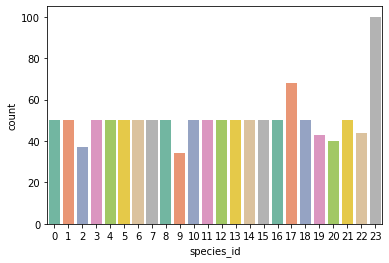

In [ ]:
sns.countplot(train_tp['species_id'],palette = "Set2")

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='songtype_id', ylabel='count'>

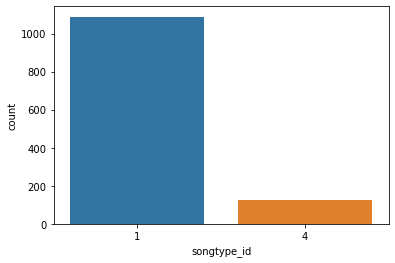

In [ ]:
sns.countplot(train_tp['songtype_id'])

In [ ]:
s,sr = librosa.load('/kaggle/input/rfcx-species-audio-detection/train/'+train_audio[1])
s1,sr1 = librosa.load('/kaggle/input/rfcx-species-audio-detection/train/'+train_audio[0])
print(type(s), type(sr))
print(s.shape, sr)

print(type(s1), type(sr1))
print(s1.shape, sr1)

<class 'numpy.ndarray'> <class 'int'>
(1323000,) 22050
<class 'numpy.ndarray'> <class 'int'>
(1323000,) 22050


In [ ]:
s, s.shape, sr, len(s)

(array([ 0.04461813,  0.03622607, -0.0205552 , ..., -0.00215999,
        -0.00020755,  0.01177161], dtype=float32),
 (1323000,),
 22050,
 1323000)

In [ ]:
s1, s1.shape, sr1, len(s1)

(array([ 0.09287961,  0.1210347 ,  0.07994029, ..., -0.00158744,
         0.00376235,  0.00843606], dtype=float32),
 (1323000,),
 22050,
 1323000)

In [ ]:
ipd.Audio(s,rate =sr)

In [ ]:
ipd.Audio(s1,rate =sr1)

In [ ]:
# Duration of one sample
sample_duration = 1/sr
print('sample_duration of train[1]: {} seconds'.format(sample_duration))
print(f"{sample_duration:6f} seconds")

sample_duration of train[1]: 4.5351473922902495e-05 seconds
0.000045 seconds


Text(0.5, 1.0, 'Train[0]')

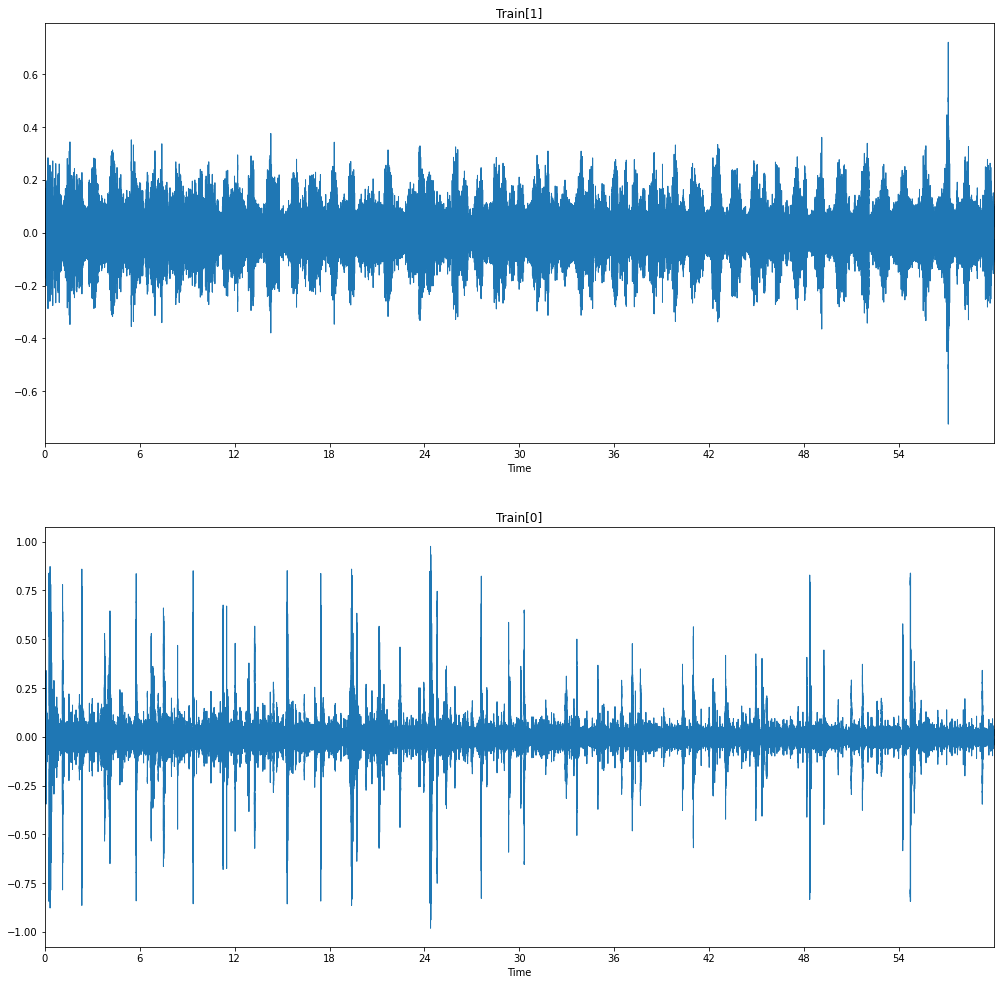

In [ ]:
plt.figure(figsize=(17, 17))

plt.subplot(2, 1, 1)
librosa.display.waveplot(s, sr=sr)
plt.title('Train[1]')

plt.subplot(2, 1, 2)
librosa.display.waveplot(s1, sr=sr1)
plt.title('Train[0]')



In [ ]:
# Calculating amplitude envelope
def amplitude_envelope(signal, frame_size, hop_length):
    amplitude_envelope = []
    
    for i in range(0, len(signal), hop_length): 
        amplitude_envelope_current_frame = max(signal[i:i+frame_size]) 
        amplitude_envelope.append(amplitude_envelope_current_frame)
        
    return np.array(amplitude_envelope)

In [ ]:
# number of frames in amplitude envelope
FRAME_SIZE = 1024
HOP_LENGTH = 512
s_envlp = amplitude_envelope(s, FRAME_SIZE, HOP_LENGTH)
len(s_envlp)

2584

In [ ]:
frames = range(len(s_envlp))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

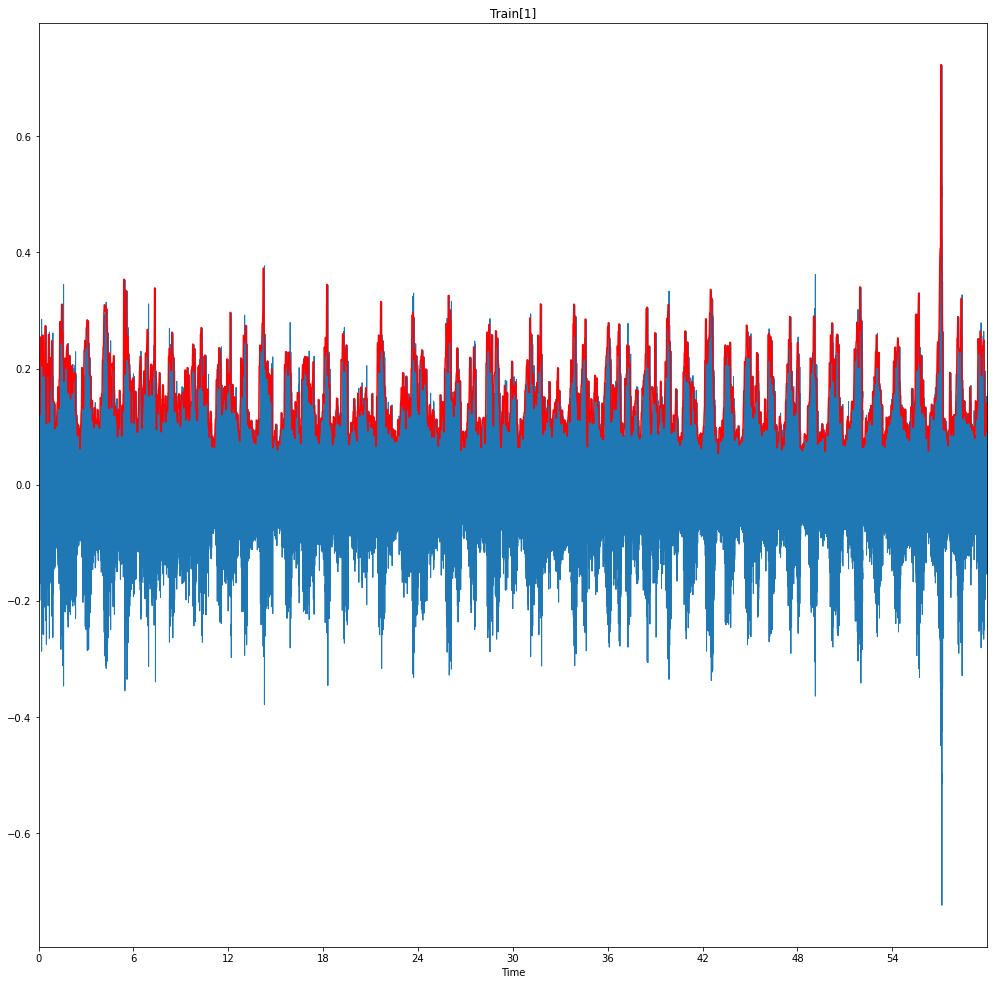

In [ ]:
plt.figure(figsize=(17, 17))

librosa.display.waveplot(s, sr=sr)
plt.plot(t, s_envlp, color="r")
plt.title('Train[1]')
plt.show()


In [ ]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [ ]:
rms_s = librosa.feature.rms(s, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_s1 = librosa.feature.rms(s1, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [ ]:
rms_s.shape

(2584,)

In [ ]:
frames = range(len(rms_s))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

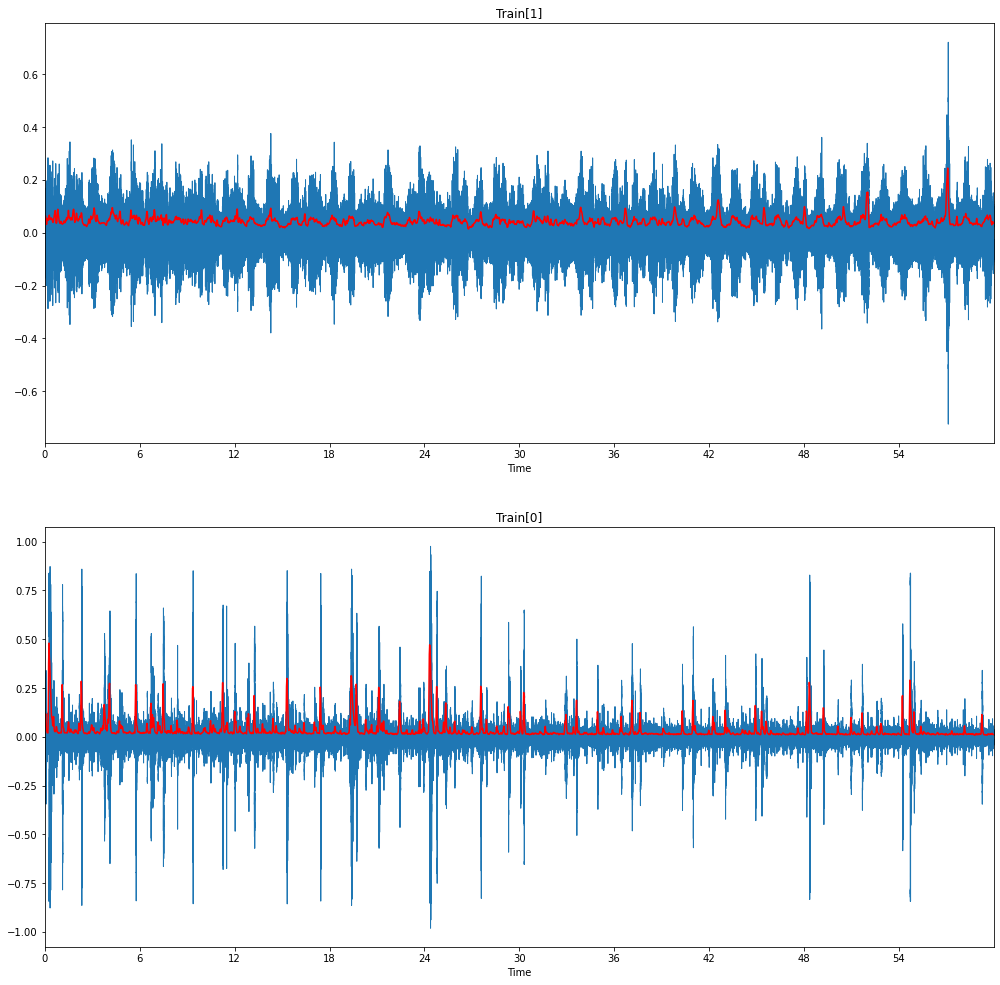

In [ ]:
# Visualise RMSE + waveform

plt.figure(figsize=(17, 17))

plt.subplot(2, 1, 1)
librosa.display.waveplot(s, sr=sr)
plt.plot(t, rms_s, color="r")
plt.title('Train[1]')

plt.subplot(2, 1, 2)
librosa.display.waveplot(s1, sr=sr1)
plt.plot(t, rms_s1, color="r")
plt.title('Train[0]')

plt.show()

In [ ]:
# Zero-crossing rate with Librosa

zcr_s = librosa.feature.zero_crossing_rate(s, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zcr_s1 = librosa.feature.zero_crossing_rate(s1, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [ ]:
zcr_s.shape

(2584,)

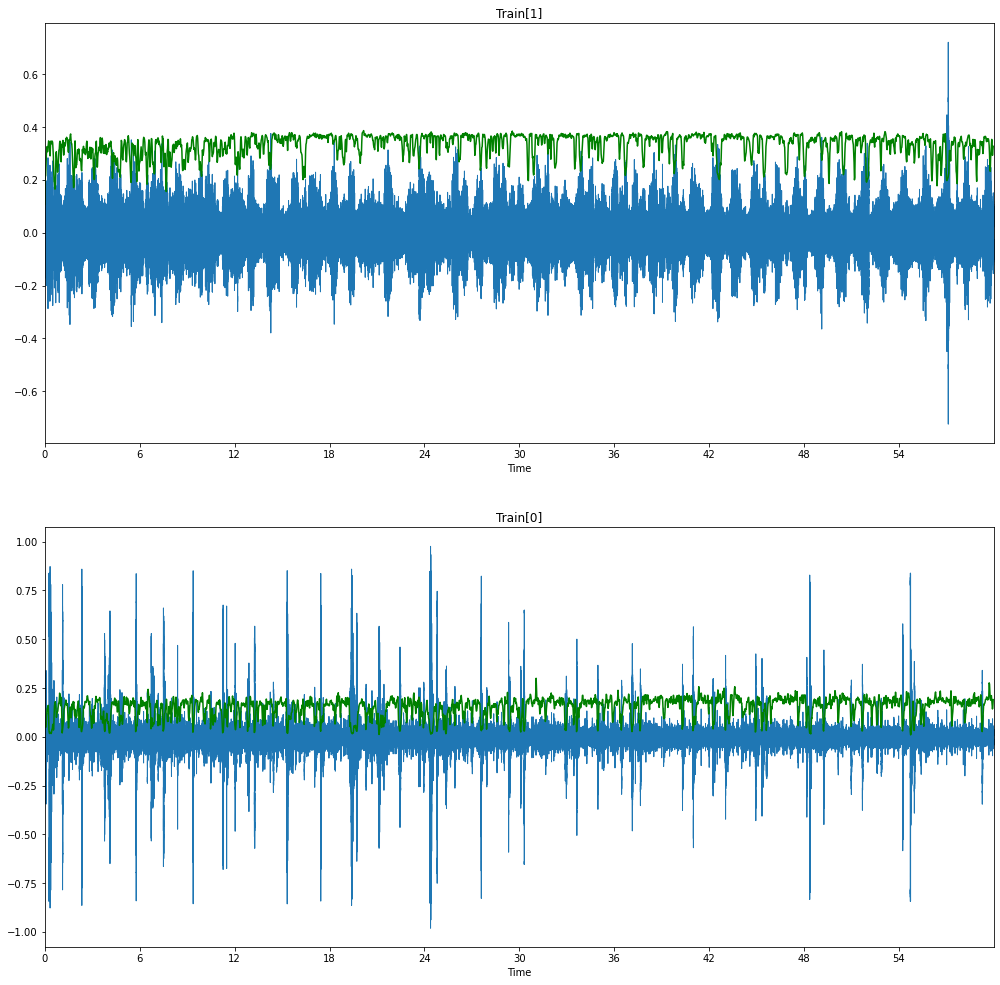

In [ ]:
plt.figure(figsize=(17, 17))

plt.subplot(2, 1, 1)
librosa.display.waveplot(s, sr=sr)
plt.plot(t, zcr_s, color="g")
plt.title('Train[1]')

plt.subplot(2, 1, 2)
librosa.display.waveplot(s1, sr=sr1)
plt.plot(t, zcr_s1, color="g")
plt.title('Train[0]')

plt.show()

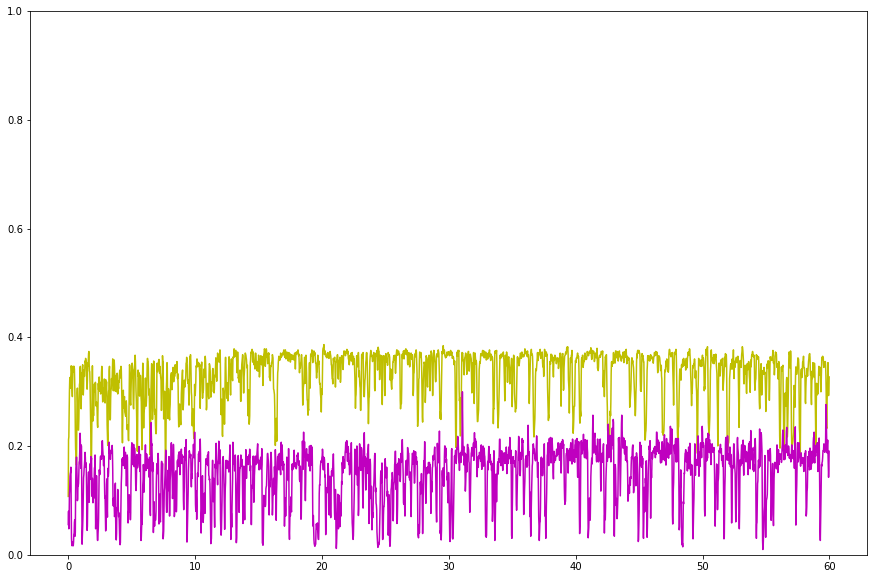

In [ ]:
plt.figure(figsize=(15, 10))

plt.plot(t, zcr_s, color="y")
plt.plot(t, zcr_s1, color="m")

plt.ylim(0, 1)
plt.show()


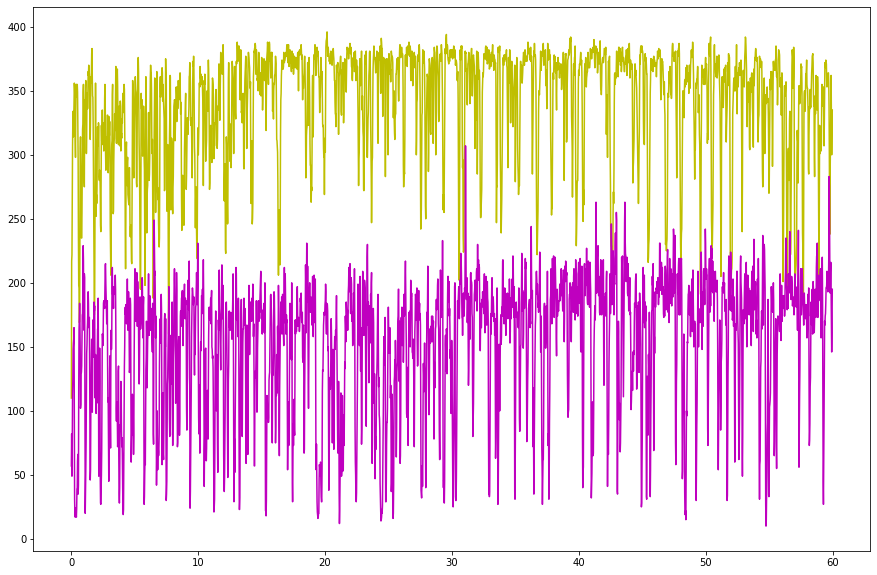

In [ ]:
plt.figure(figsize=(15, 10))

plt.plot(t, zcr_s * FRAME_SIZE, color="y")
plt.plot(t, zcr_s1* FRAME_SIZE, color="m")

plt.show()

In [ ]:
train_audio[1]

'e6af91bbf.flac'

In [ ]:
train_tp.loc[train_tp.recording_id =='e6af91bbf' ]

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
1109,e6af91bbf,12,1,1.5573,562.5,4.6933,3281.25


Text(0.5, 1.0, 'Linear-frequency power spectrogram')

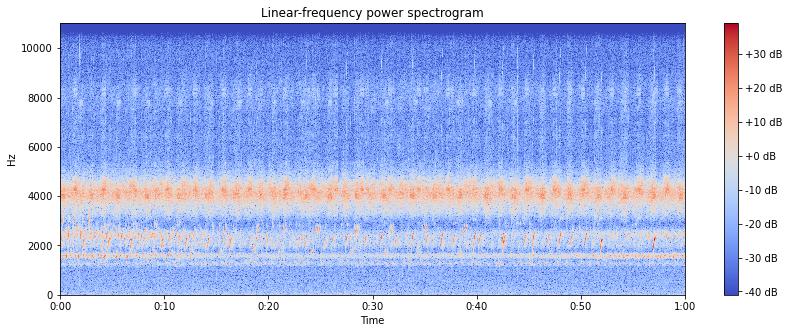

In [ ]:
X = librosa.stft(s)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

/opt/conda/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/opt/conda/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/opt/conda/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


Text(0.5, 1.0, 'Log-frequency power spectrogram')

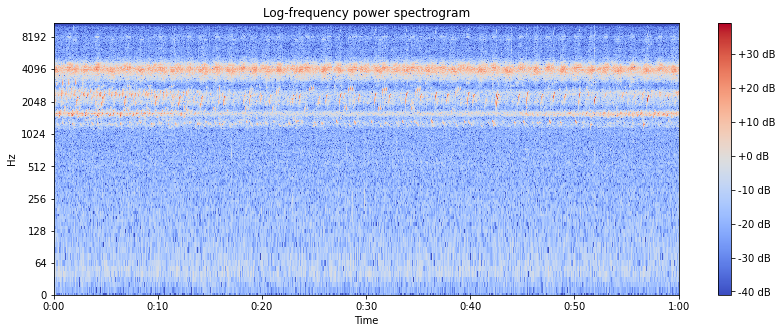

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-frequency power spectrogram')

In [ ]:
# Creating melspectrogram
S = librosa.feature.melspectrogram(y=s, sr=sr)
S,S.shape

(array([[1.9042915e-02, 2.8778344e-02, 1.6786635e-02, ..., 1.8322283e-02,
         8.8602137e-03, 1.6778635e-03],
        [5.7240226e-03, 2.1960512e-02, 4.2130068e-02, ..., 1.9561049e-02,
         1.2730556e-02, 5.5021606e-03],
        [4.3413006e-03, 1.3643579e-02, 2.6859060e-02, ..., 4.5628706e-03,
         6.7011947e-03, 7.6585733e-03],
        ...,
        [1.4665750e-04, 1.3733047e-04, 1.2649084e-04, ..., 1.6462927e-04,
         1.3135247e-04, 9.7268014e-05],
        [1.8710691e-04, 8.8981520e-05, 4.3546905e-05, ..., 5.9807797e-05,
         5.9302489e-05, 5.9128874e-05],
        [2.0860316e-04, 5.4585820e-05, 2.4526471e-06, ..., 4.4521134e-06,
         4.3610016e-06, 6.1300366e-06]], dtype=float32),
 (128, 2584))

In [ ]:
# Creating melspectrogram
S2 = librosa.feature.melspectrogram(s1, sr1)
S2,S2.shape

(array([[2.4126828e-02, 3.0414971e-02, 9.5098861e-02, ..., 8.5041334e-04,
         2.1018619e-03, 3.8082325e-03],
        [1.4748956e-01, 2.9811573e-01, 8.4020293e-01, ..., 3.9809719e-03,
         4.7790185e-03, 6.8388870e-03],
        [1.6059853e+00, 2.7084315e+00, 3.4061816e+00, ..., 1.0418288e-02,
         4.3984163e-03, 8.7333266e-03],
        ...,
        [1.0649824e-03, 1.4340203e-03, 2.0474922e-03, ..., 2.9519023e-04,
         2.6090682e-04, 4.3841149e-04],
        [1.7484828e-03, 1.4212955e-03, 1.0912108e-03, ..., 1.2689542e-04,
         1.2439481e-04, 1.5408263e-04],
        [9.4943680e-04, 3.1646769e-04, 4.5852441e-05, ..., 2.0136484e-05,
         1.2719573e-05, 1.2194021e-05]], dtype=float32),
 (128, 2584))

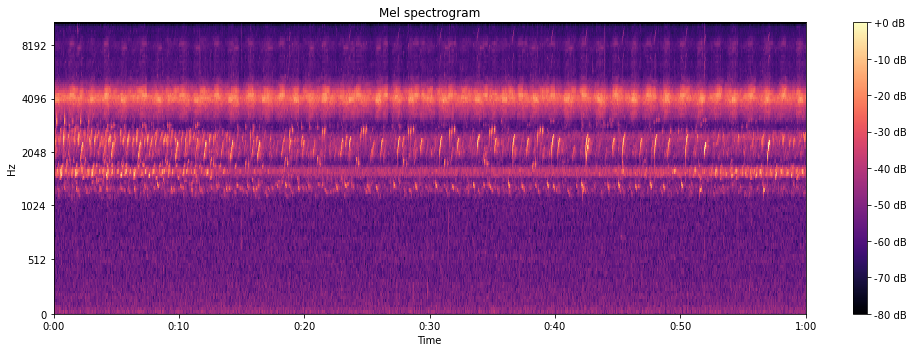

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(librosa.power_to_db(S,ref=np.max), sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.tight_layout()

In [ ]:
train_tp.loc[train_tp.recording_id == '5f8eecc9e']


,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
474,5f8eecc9e,23,4,51.0084,6459.96,58.9322,11627.9
475,5f8eecc9e,9,1,54.9440,1125.00,57.7493,5250.0
476,5f8eecc9e,9,1,48.5547,1125.00,51.3600,5250.0
477,5f8eecc9e,23,4,7.9412,6459.96,15.8650,11627.9


In [ ]:
train_tp.loc[train_tp.songtype_id==4]

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
3,0099c367b,17,4,51.4206,1464.26,55.1996,4565.04
18,0313e82cf,16,4,21.4720,3093.75,23.3067,4593.75
19,03b96f209,16,4,30.9333,3093.75,32.7680,4593.75
20,03b96f209,16,4,49.6320,3093.75,51.4667,4593.75
24,04d6b1fc1,17,4,4.7307,1406.25,7.3387,3937.50
...,...,...,...,...,...,...,...
1170,f33a1793f,16,4,8.3147,3093.75,10.1493,4593.75
1179,f5889157c,16,4,53.0400,3093.75,54.8747,4593.75
1187,f84b8c8d3,23,4,1.1958,6459.96,9.1196,11627.90
1190,f8c661973,16,4,18.2347,3093.75,20.0693,4593.75


In [ ]:
# Number of unique songtype_id for each species_id
train_tp.groupby(by='species_id', as_index=False).agg({'songtype_id': pd.Series.nunique})

,species_id,songtype_id
0,0,1
1,1,1
2,2,1
3,3,1
4,4,1
5,5,1
6,6,1
7,7,1
8,8,1
9,9,1


In [ ]:
train_tp

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
0,003bec244,14,1,44.5440,2531.250,45.1307,5531.25
1,006ab765f,23,1,39.9615,7235.160,46.0452,11283.40
2,007f87ba2,12,1,39.1360,562.500,42.2720,3281.25
3,0099c367b,17,4,51.4206,1464.260,55.1996,4565.04
4,009b760e6,10,1,50.0854,947.461,52.5293,10852.70
...,...,...,...,...,...,...,...
1211,fe8d9ac40,13,1,53.4720,93.750,54.0960,843.75
1212,fea6b438a,4,1,43.5787,2531.250,45.7653,4031.25
1213,ff2eb9ce5,0,1,15.2267,5906.250,16.0213,8250.00
1214,ffb8d8391,5,1,14.3467,4781.250,16.6987,10406.20


In [ ]:
train_tp['total_time'] = train_tp['t_max']-train_tp['t_min']
train_tp.head()

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max,total_time
0,003bec244,14,1,44.5440,2531.250,45.1307,5531.25,0.5867
1,006ab765f,23,1,39.9615,7235.160,46.0452,11283.40,6.0837
2,007f87ba2,12,1,39.1360,562.500,42.2720,3281.25,3.1360
3,0099c367b,17,4,51.4206,1464.260,55.1996,4565.04,3.7790
4,009b760e6,10,1,50.0854,947.461,52.5293,10852.70,2.4439


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='total_time'>

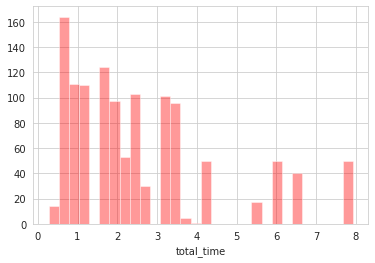

In [ ]:
sns.set_style('whitegrid') 
sns.distplot(train_tp['total_time'], kde = False, color ='red', bins = 30) 

<AxesSubplot:xlabel='species_id', ylabel='total_time'>

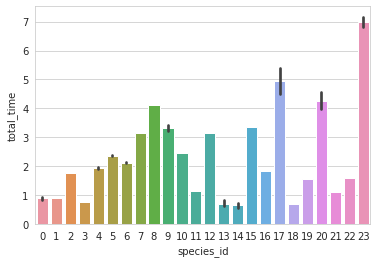

In [ ]:
sns.barplot(x ='species_id', y ='total_time', data = train_tp)

In [ ]:
train_tp

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max,total_time
0,003bec244,14,1,44.5440,2531.250,45.1307,5531.25,0.5867
1,006ab765f,23,1,39.9615,7235.160,46.0452,11283.40,6.0837
2,007f87ba2,12,1,39.1360,562.500,42.2720,3281.25,3.1360
3,0099c367b,17,4,51.4206,1464.260,55.1996,4565.04,3.7790
4,009b760e6,10,1,50.0854,947.461,52.5293,10852.70,2.4439
...,...,...,...,...,...,...,...,...
1211,fe8d9ac40,13,1,53.4720,93.750,54.0960,843.75,0.6240
1212,fea6b438a,4,1,43.5787,2531.250,45.7653,4031.25,2.1866
1213,ff2eb9ce5,0,1,15.2267,5906.250,16.0213,8250.00,0.7946
1214,ffb8d8391,5,1,14.3467,4781.250,16.6987,10406.20,2.3520


In [ ]:
train_tp['recording_id']

0       003bec244
1       006ab765f
2       007f87ba2
3       0099c367b
4       009b760e6
          ...    
1211    fe8d9ac40
1212    fea6b438a
1213    ff2eb9ce5
1214    ffb8d8391
1215    ffb9a7b9a
Name: recording_id, Length: 1216, dtype: object

In [ ]:
train_tp['species_id']

0       14
1       23
2       12
3       17
4       10
        ..
1211    13
1212     4
1213     0
1214     5
1215    18
Name: species_id, Length: 1216, dtype: int64

In [ ]:
@tf.function
def _one_sample_positive_class_precisions(example):
    y_true, y_pred = example

    retrieved_classes = tf.argsort(y_pred, direction='DESCENDING')
    class_rankings = tf.argsort(retrieved_classes)
    retrieved_class_true = tf.gather(y_true, retrieved_classes)
    retrieved_cumulative_hits = tf.math.cumsum(tf.cast(retrieved_class_true, tf.float32))

    idx = tf.where(y_true)[:, 0]
    i = tf.boolean_mask(class_rankings, y_true)
    r = tf.gather(retrieved_cumulative_hits, i)
    c = 1 + tf.cast(i, tf.float32)
    precisions = r / c

    dense = tf.scatter_nd(idx[:, None], precisions, [y_pred.shape[0]])
    return dense


class LWLRAP(tf.keras.metrics.Metric):
    def __init__(self, num_classes, name='lwlrap'):
        super().__init__(name=name)

        self._precisions = self.add_weight(
            name='per_class_cumulative_precision',
            shape=[num_classes],
            initializer='zeros',
        )

        self._counts = self.add_weight(
            name='per_class_cumulative_count',
            shape=[num_classes],
            initializer='zeros',
        )

    def update_state(self, y_true, y_pred, sample_weight=None):
        precisions = tf.map_fn(
            fn=_one_sample_positive_class_precisions,
            elems=(y_true, y_pred),
            dtype=(tf.float32),
        )

        increments = tf.cast(precisions > 0, tf.float32)
        total_increments = tf.reduce_sum(increments, axis=0)
        total_precisions = tf.reduce_sum(precisions, axis=0)

        self._precisions.assign_add(total_precisions)
        self._counts.assign_add(total_increments)        

    def result(self):
        per_class_lwlrap = self._precisions / tf.maximum(self._counts, 1.0)
        per_class_weight = self._counts / tf.reduce_sum(self._counts)
        overall_lwlrap = tf.reduce_sum(per_class_lwlrap * per_class_weight)
        return overall_lwlrap

    def reset_states(self):
        self._precisions.assign(self._precisions * 0)
        self._counts.assign(self._counts * 0)

In [ ]:
from pathlib import Path
from tqdm.notebook import tqdm

In [ ]:
!pip install resnest > /dev/null

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [ ]:
import tensorflow_addons as tfa

In [ ]:
!pip install image-classifiers

     |████████████████████████████████| 50 kB 1.4 MB/s 
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [ ]:
from classification_models.keras import Classifiers
ResNet34, preprocess_input = Classifiers.get('resnet34')

In [ ]:
cfg = {
    'parse_params': {
        'cut_time': 10,
    },
    'data_params': {
        'sample_time': 6, # assert 60 % sample_time == 0
        'spec_fmax': 24000.0,
        'spec_fmin': 40.0,
        'spec_mel': 384, 
        'mel_power': 2,
        'img_shape': (384, 768)
    },
    'model_params': {
        'batchsize_per_tpu': 18,
        'iteration_per_epoch': 64,
        'epoch': 25, 
        'arch': ResNet34,
        'arch_preprocess': preprocess_input,
        'freeze_to': 0,  # Freeze to backbone.layers[:freeze_to]. If None, all layers in the backbone will be freezed.
        'loss': {
            'fn': tfa.losses.SigmoidFocalCrossEntropy,
            'params': {},
        },
        'optim': {
            'fn': tfa.optimizers.RectifiedAdam,
            'params': {'lr': 2e-3, 'total_steps': 18*64, 'warmup_proportion': 0.3, 'min_lr': 1e-6},
        },
        'mixup': True # False
    }
}

In [ ]:
# detect and init the TPU
tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
print("All devices: ", tf.config.list_logical_devices('TPU'))

All devices:  [LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:5', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:4', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:3', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:2', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:6', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:7', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:1', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:0', device_type='TPU')]


In [ ]:
strategy = tf.distribute.experimental.TPUStrategy(tpu)
from kaggle_datasets import KaggleDatasets
AUTOTUNE = tf.data.experimental.AUTOTUNE
GCS_DS_PATH = KaggleDatasets().get_gcs_path('rfcx-species-audio-detection')

TRAIN_TFREC = GCS_DS_PATH + "/tfrecords/train"
TEST_TFREC = GCS_DS_PATH + "/tfrecords/test"


In [ ]:
CUT = cfg['parse_params']['cut_time']
SR = 48000     # all wave's sample rate may be 48k

TIME = cfg['data_params']['sample_time']

FMAX = cfg['data_params']['spec_fmax']
FMIN = cfg['data_params']['spec_fmin']
N_MEL = cfg['data_params']['spec_mel']

HEIGHT, WIDTH = cfg['data_params']['img_shape']

CLASS_N = 24


In [ ]:
raw_dataset = tf.data.TFRecordDataset([TRAIN_TFREC + '/00-148.tfrec'])
raw_dataset

<TFRecordDatasetV2 shapes: (), types: tf.string>

In [ ]:
feature_description = {
    'recording_id': tf.io.FixedLenFeature([], tf.string, default_value=''),
    'audio_wav': tf.io.FixedLenFeature([], tf.string, default_value=''),
    'label_info': tf.io.FixedLenFeature([], tf.string, default_value=''),
}

parse_dtype = {
    'audio_wav': tf.float32,
    'recording_id': tf.string,
    'species_id': tf.int32,
    'songtype_id': tf.int32,
    't_min': tf.float32,
    'f_min': tf.float32,
    't_max': tf.float32,
    'f_max':tf.float32,
    'is_tp': tf.int32
}

@tf.function
def _parse_function(example_proto):
    sample = tf.io.parse_single_example(example_proto, feature_description)
    wav, _ = tf.audio.decode_wav(sample['audio_wav'], desired_channels=1) # mono
    label_info = tf.strings.split(sample['label_info'], sep='"')[1]
    labels = tf.strings.split(label_info, sep=';')
    
    @tf.function
    def _cut_audio(label):
        items = tf.strings.split(label, sep=',')
        spid = tf.squeeze(tf.strings.to_number(items[0], tf.int32))
        soid = tf.squeeze(tf.strings.to_number(items[1], tf.int32))
        tmin = tf.squeeze(tf.strings.to_number(items[2]))
        fmin = tf.squeeze(tf.strings.to_number(items[3]))
        tmax = tf.squeeze(tf.strings.to_number(items[4]))
        fmax = tf.squeeze(tf.strings.to_number(items[5]))
        tp = tf.squeeze(tf.strings.to_number(items[6], tf.int32))

        tmax_s = tmax * tf.cast(SR, tf.float32)
        tmin_s = tmin * tf.cast(SR, tf.float32)
        cut_s = tf.cast(CUT * SR, tf.float32)
        all_s = tf.cast(60 * SR, tf.float32)
        tsize_s = tmax_s - tmin_s
        cut_min = tf.cast(
            tf.maximum(0.0, 
                tf.minimum(tmin_s - (cut_s - tsize_s) / 2,
                           tf.minimum(tmax_s + (cut_s - tsize_s) / 2, all_s) - cut_s)
            ), tf.int32
        )
        cut_max = cut_min + CUT * SR
        
        _sample = {
            'audio_wav': tf.reshape(wav[cut_min:cut_max], [CUT*SR]),
            'recording_id': sample['recording_id'],
            'species_id': spid,
            'songtype_id': soid,
            't_min': tmin - tf.cast(cut_min, tf.float32)/tf.cast(SR, tf.float32),
            'f_min': fmin,
            't_max': tmax - tf.cast(cut_min, tf.float32)/tf.cast(SR, tf.float32),
            'f_max': fmax,
            'is_tp': tp
        }
        return _sample
    
    samples = tf.map_fn(_cut_audio, labels, dtype=parse_dtype)
    return samples

parsed_dataset = raw_dataset.map(_parse_function).unbatch()

In [ ]:
@tf.function
def _cut_wav(x):
    # random cut in training
    cut_min = tf.random.uniform([], maxval=(CUT-TIME)*SR, dtype=tf.int32)
    cut_max = cut_min + TIME * SR
    cutwave = tf.reshape(x['audio_wav'][cut_min:cut_max], [TIME*SR])
    y = {}
    y.update(x)
    y['audio_wav'] = cutwave
    y['t_min'] = tf.maximum(0.0, x['t_min'] - tf.cast(cut_min, tf.float32) / SR)
    y['t_max'] = tf.maximum(0.0, x['t_max'] - tf.cast(cut_min, tf.float32) / SR)
    return y
    
@tf.function
def _cut_wav_val(x):
    # center crop in validation
    cut_min = (CUT-TIME)*SR // 2
    cut_max = cut_min + TIME * SR
    cutwave = tf.reshape(x['audio_wav'][cut_min:cut_max], [TIME*SR])
    y = {}
    y.update(x)
    y['audio_wav'] = cutwave
    y['t_min'] = tf.maximum(0.0, x['t_min'] - tf.cast(cut_min, tf.float32) / SR)
    y['t_max'] = tf.maximum(0.0, x['t_max'] - tf.cast(cut_min, tf.float32) / SR)
    return y

In [ ]:
@tf.function
def _filtTP(x):
    return x['is_tp'] == 1

In [ ]:
from IPython.display import Audio

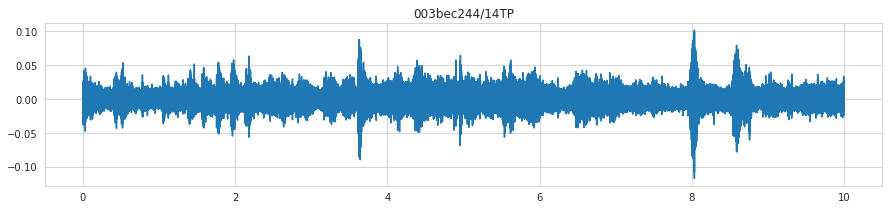

In [ ]:
def show_wav(sample, ax):
    wav = sample["audio_wav"].numpy()
    rate = SR
    ax.plot(np.arange(len(wav)) / rate, wav)
    ax.set_title(
        sample["recording_id"].numpy().decode()
        + ("/%d" % sample["species_id"])
        + ("TP" if sample["is_tp"] else "FP"))

    return Audio((wav * 2**15).astype(np.int16), rate=rate)

fig, ax = plt.subplots(figsize=(15, 3))
show_wav(next(iter(parsed_dataset)), ax)

In [ ]:
@tf.function
def _wav_to_spec(x):
    mel_power = cfg['data_params']['mel_power']
    
    stfts = tf.signal.stft(x["audio_wav"], frame_length=2048, frame_step=512, fft_length=2048)
    spectrograms = tf.abs(stfts) ** mel_power

    # Warp the linear scale spectrograms into the mel-scale.
    num_spectrogram_bins = stfts.shape[-1]
    lower_edge_hertz, upper_edge_hertz, num_mel_bins = FMIN, FMAX, N_MEL
    
    linear_to_mel_weight_matrix = tf.signal.linear_to_mel_weight_matrix(
      num_mel_bins, num_spectrogram_bins, SR, lower_edge_hertz,
      upper_edge_hertz)
    mel_spectrograms = tf.tensordot(
      spectrograms, linear_to_mel_weight_matrix, 1)
    mel_spectrograms.set_shape(spectrograms.shape[:-1].concatenate(
      linear_to_mel_weight_matrix.shape[-1:]))

    # Compute a stabilized log to get log-magnitude mel-scale spectrograms.
    log_mel_spectrograms = tf.math.log(mel_spectrograms + 1e-6)

    y = {
        'audio_spec': tf.transpose(log_mel_spectrograms), # (num_mel_bins, frames)
    }
    y.update(x)
    return y

spec_dataset = parsed_dataset.filter(_filtTP).map(_cut_wav).map(_wav_to_spec)

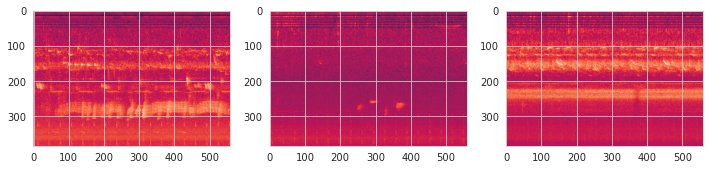

In [ ]:
plt.figure(figsize=(12,5))
for i, s in enumerate(spec_dataset.take(3)):
    plt.subplot(1,3,i+1)
    plt.imshow(s['audio_spec'])
plt.show()

In [ ]:
import librosa.display
import matplotlib.patches as patches

def show_spectrogram(sample, ax, showlabel=False):
    S_dB = sample["audio_spec"].numpy()
    img = librosa.display.specshow(S_dB, x_axis='time',
                             y_axis='mel', sr=SR,
                             fmax=FMAX, fmin=FMIN, ax=ax, cmap='magma')
    ax.set(title=f'Mel-frequency spectrogram of {sample["recording_id"].numpy().decode()}')
    sid, fmin, fmax, tmin, tmax, istp = (
            sample["species_id"], sample["f_min"], sample["f_max"], sample["t_min"], sample["t_max"], sample["is_tp"])
    ec = '#00ff00' if istp == 1 else '#0000ff'
    ax.add_patch(
        patches.Rectangle(xy=(tmin, fmin), width=tmax-tmin, height=fmax-fmin, ec=ec, fill=False)
    )

    if showlabel:
        ax.text(tmin, fmax, 
        f"{sid.numpy().item()} {'tp' if istp == 1 else 'fp'}",
        horizontalalignment='left', verticalalignment='bottom', color=ec, fontsize=16)

/opt/conda/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/opt/conda/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


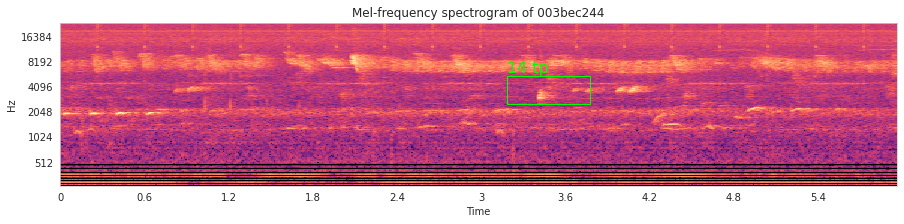

In [ ]:
fig, ax = plt.subplots(figsize=(15,3))
show_spectrogram(next(iter(spec_dataset)), ax, showlabel=True)


In [ ]:
# Preprocessing and data augmentation
@tf.function
def _preprocess_img(x, training=False, test=False):
    image = tf.expand_dims(x, axis=-1)
    image = tf.image.resize(image, [HEIGHT, WIDTH])
    image = tf.image.per_image_standardization(image)
    
    @tf.function
    def _specaugment(image):
        ERASE_TIME = 50
        ERASE_MEL = 16
        image = tf.expand_dims(image, axis=0)
        xoff = tf.random.uniform([2], minval=ERASE_TIME//2, maxval=WIDTH-ERASE_TIME//2, dtype=tf.int32)
        xsize = tf.random.uniform([2], minval=ERASE_TIME//2, maxval=ERASE_TIME, dtype=tf.int32)
        yoff = tf.random.uniform([2], minval=ERASE_MEL//2, maxval=HEIGHT-ERASE_MEL//2, dtype=tf.int32)
        ysize = tf.random.uniform([2], minval=ERASE_MEL//2, maxval=ERASE_MEL, dtype=tf.int32)
        image = tfa.image.cutout(image, [HEIGHT, xsize[0]], offset=[HEIGHT//2, xoff[0]])
        image = tfa.image.cutout(image, [HEIGHT, xsize[1]], offset=[HEIGHT//2, xoff[1]])
        image = tfa.image.cutout(image, [ysize[0], WIDTH], offset=[yoff[0], WIDTH//2])
        image = tfa.image.cutout(image, [ysize[1], WIDTH], offset=[yoff[1], WIDTH//2])
        image = tf.squeeze(image, axis=0)
        return image
    
    if training:
        # gaussian
        gau = tf.keras.layers.GaussianNoise(0.3)
        image = tf.cond(tf.random.uniform([]) < 0.5, lambda: gau(image, training=True), lambda: image)
        # brightness
        image = tf.image.random_brightness(image, 0.2)
        # random left right flip (NEW)
        image = tf.image.random_flip_left_right(image)
        # specaugment
        image = tf.cond(tf.random.uniform([]) < 0.5, lambda: _specaugment(image), lambda: image)
        
    if test:
        # Insert augmentations for TTA here
        #image = tf.cond(tf.random.uniform([]) < 0.5, lambda: _specaugment(image), lambda: image)
        pass
        
    image = (image - tf.reduce_min(image)) / (tf.reduce_max(image) - tf.reduce_min(image)) * 255.0 # rescale to [0, 255]
    image = tf.image.grayscale_to_rgb(image)
    image = cfg['model_params']['arch_preprocess'](image)

    return image

@tf.function
def _preprocess(x):
    image = _preprocess_img(x['input'], training=True, test=False)
    return (image, x["target"])

@tf.function
def _preprocess_val(x):
    image = _preprocess_img(x['input'], training=False, test=False)
    return (image, x["target"])

@tf.function
def _preprocess_test(x):
    image = _preprocess_img(x['audio_spec'], training=False, test=True)
    return (image, x["recording_id"])

In [ ]:
from tqdm import tqdm

In [ ]:
indices = []
spid = []
recid = []

for i, sample in tqdm(parsed_trainval.prefetch(AUTOTUNE)):
    indices.append(i.numpy())
    spid.append(sample['species_id'].numpy())
    recid.append(sample['recording_id'].numpy().decode())

1216it [00:52, 23.35it/s]


In [ ]:
table = pd.DataFrame({'indices': indices, 'species_id': spid, 'recording_id': recid})
table

,indices,species_id,recording_id
0,0,14,003bec244
1,1,12,2026bced7
2,2,21,422de4e4d
3,3,6,60a493ad4
4,4,13,8080b2283
...,...,...,...
1211,1211,3,807efd6bb
1212,1212,20,a6610076b
1213,1213,23,c91cae4aa
1214,1214,3,c91cae4aa
